![NYC Skyline](nyc.jpg)

Welcome to New York City, one of the most-visited cities in the world. There are many Airbnb listings in New York City to meet the high demand for temporary lodging for travelers, which can be anywhere between a few nights to many months. In this project, we will take a closer look at the New York Airbnb market by combining data from multiple file types like `.csv`, `.tsv`, and `.xlsx`.

Recall that **CSV**, **TSV**, and **Excel** files are three common formats for storing data. 
Three files containing data on 2019 Airbnb listings are available to you:

**data/airbnb_price.csv**
This is a CSV file containing data on Airbnb listing prices and locations.
- **`listing_id`**: unique identifier of listing
- **`price`**: nightly listing price in USD
- **`nbhood_full`**: name of borough and neighborhood where listing is located

**data/airbnb_room_type.xlsx**
This is an Excel file containing data on Airbnb listing descriptions and room types.
- **`listing_id`**: unique identifier of listing
- **`description`**: listing description
- **`room_type`**: Airbnb has three types of rooms: shared rooms, private rooms, and entire homes/apartments

**data/airbnb_last_review.tsv**
This is a TSV file containing data on Airbnb host names and review dates.
- **`listing_id`**: unique identifier of listing
- **`host_name`**: name of listing host
- **`last_review`**: date when the listing was last reviewed

In [1]:
# Import necessary packages
import pandas as pd
import numpy as np

In [2]:
prices_df = pd.read_csv('data/airbnb_price.csv')
prices_df.head(8)

,listing_id,price,nbhood_full
0,2595,225 dollars,"Manhattan, Midtown"
1,3831,89 dollars,"Brooklyn, Clinton Hill"
2,5099,200 dollars,"Manhattan, Murray Hill"
3,5178,79 dollars,"Manhattan, Hell's Kitchen"
4,5238,150 dollars,"Manhattan, Chinatown"
5,5295,135 dollars,"Manhattan, Upper West Side"
6,5441,85 dollars,"Manhattan, Hell's Kitchen"
7,5803,89 dollars,"Brooklyn, South Slope"


In [3]:
room_types_df = pd.read_excel('data/airbnb_room_type.xlsx')
room_types_df.head(8)

,listing_id,description,room_type
0,2595,Skylit Midtown Castle,Entire home/apt
1,3831,Cozy Entire Floor of Brownstone,Entire home/apt
2,5099,Large Cozy 1 BR Apartment In Midtown East,Entire home/apt
3,5178,Large Furnished Room Near B'way,private room
4,5238,Cute & Cozy Lower East Side 1 bdrm,Entire home/apt
5,5295,Beautiful 1br on Upper West Side,Entire home/apt
6,5441,Central Manhattan/near Broadway,Private room
7,5803,"Lovely Room 1, Garden, Best Area, Legal rental",Private room


In [4]:
reviews_df = pd.read_csv('data/airbnb_last_review.tsv',delimiter='\t')
reviews_df.head(8)

,listing_id,host_name,last_review
0,2595,Jennifer,May 21 2019
1,3831,LisaRoxanne,July 05 2019
2,5099,Chris,June 22 2019
3,5178,Shunichi,June 24 2019
4,5238,Ben,June 09 2019
5,5295,Lena,June 22 2019
6,5441,Kate,June 23 2019
7,5803,Laurie,June 24 2019


# Basic Analysis

In [6]:
# 1. Extract the earliest and most recent review dates
earliest_review = reviews_df['last_review'].min()
most_recent_review = reviews_df['last_review'].max()

In [7]:
# 2. Count the number of private room listings
nb_private_rooms = len(room_types_df[room_types_df['room_type'] == 'Private room'])

In [8]:
# 3. Calculate the average listing price
prices_df['price'] = prices_df['price'].str.replace(' dollars', '').astype(float)
avg_price = round(prices_df['price'].mean(), 2)

In [9]:
# Step 5: Summary Table
review_dates = pd.DataFrame({
    "first_reviewed": [earliest_review],
    "last_reviewed": [most_recent_review],
    "nb_private_rooms": [nb_private_rooms],
    "avg_price": [avg_price]
})

In [10]:
print("Earliest Review Date:", earliest_review)
print("Most Recent Review Date:", most_recent_review)
print("Number of Private Room Listings:", nb_private_rooms)
print("Average Price:", avg_price)

print("\nSummary Table:")
print(review_dates)

Earliest Review Date: April 01 2019
Most Recent Review Date: May 31 2019
Number of Private Room Listings: 7241
Average Price: 141.78

Summary Table:
  first_reviewed last_reviewed  nb_private_rooms  avg_price
0  April 01 2019   May 31 2019              7241     141.78


# Intermediate Analysis

### Load the data and calculate average listing price per neighborhood:

In [17]:
neighborhood_trends = prices_df.groupby('nbhood_full').agg(
    average_price=('price', 'mean'),  # Calculate the average price
    number_of_listings=('listing_id', 'count')  # Count the number of listings
).reset_index()  # Reset index to make it a regular DataFrame

# Sort neighborhoods by average price in descending order
neighborhood_trends = neighborhood_trends.sort_values(by='average_price', ascending=False)

top_5_expensive_neighborhoods = neighborhood_trends.head(5)

print(top_5_expensive_neighborhoods)


                      nbhood_full  average_price  number_of_listings
88             Brooklyn, Sea Gate     805.000000                   2
121            Manhattan, Tribeca     396.704918                  61
102  Manhattan, Flatiron District     342.055556                  36
115               Manhattan, NoHo     335.024390                  41
118               Manhattan, SoHo     299.162304                 191


# Word Analysis in Descriptions
Find the top 10 most frequently used words in the description column (excluding stopwords like 'the,' 'and,' etc.). Use pandas.Series.str.split and explore the Counter class from the collections module.

In [18]:
import pandas as pd

In [19]:
from collections import Counter

In [20]:
from nltk.corpus import stopwords

In [21]:
import nltk

In [22]:
# Download stopwords
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\AAC\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [25]:
room_type_df = pd.read_excel('data/airbnb_room_type.xlsx')

# Combine all descriptions into a single string, converting non-string values to strings
all_descriptions = ' '.join(room_type_df['description'].dropna().astype(str).str.lower())

# Split the string into words
words = all_descriptions.split()

# Remove stopwords
stop_words = set(stopwords.words('english'))
filtered_words = [word for word in words if word not in stop_words]

# Count  each word
word_counts = Counter(filtered_words)

top_10_words = word_counts.most_common(10)

print("Top 10 Most Frequently Used Words in Descriptions:")
print(top_10_words)

Top 10 Most Frequently Used Words in Descriptions:
[('room', 4762), ('private', 3974), ('bedroom', 3468), ('apartment', 2952), ('cozy', 2556), ('brooklyn', 1933), ('studio', 1848), ('2', 1736), ('apt', 1731), ('&', 1688)]


# Advanced Analyze

In [28]:
import pandas as pd
import matplotlib.pyplot as plt

### Room Type Comparison

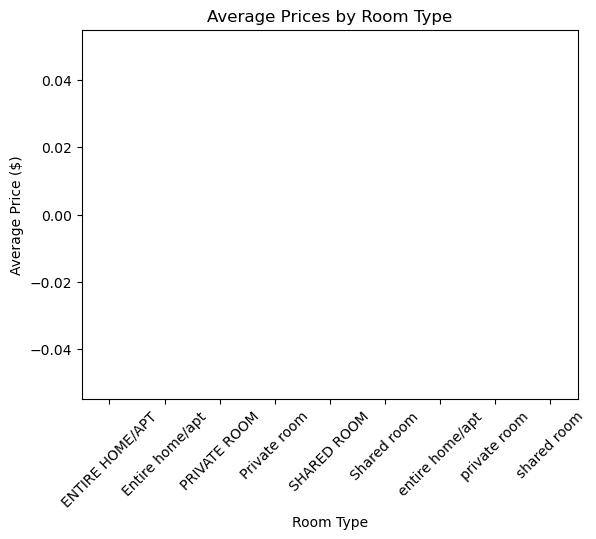

In [41]:
prices_df = pd.read_csv('data/airbnb_price.csv')
room_type_df = pd.read_excel('data/airbnb_room_type.xlsx')

# Merge dataframes on 'listing_id'
df = pd.merge(prices_df, room_type_df, on='listing_id')

# Convert 'price' column to numeric, errors will be set to NaN
df['price'] = pd.to_numeric(df['price'], errors='coerce')

# Calculate average price by room type
average_prices = df.groupby('room_type')['price'].mean()

# Create a bar chart
average_prices.plot(kind='bar', color='skyblue')

plt.title('Average Prices by Room Type')
plt.xlabel('Room Type')
plt.ylabel('Average Price ($)')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

plt.show()


### Trend Over Time

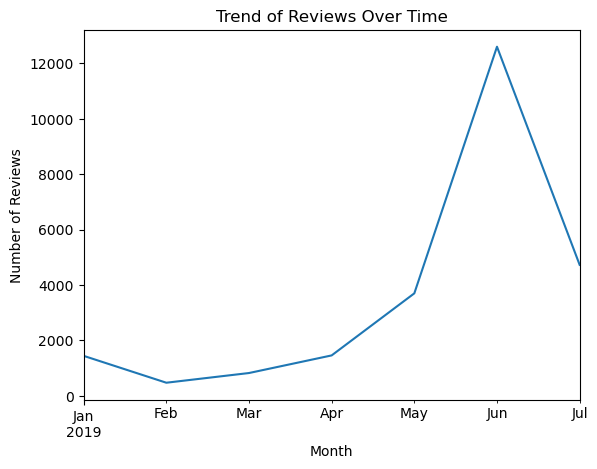

In [45]:
reviews_df = pd.read_csv('data/airbnb_last_review.tsv', sep='\t')

# Convert the review date to datetime
reviews_df['last_review'] = pd.to_datetime(reviews_df['last_review'])

# Group by month and count the number of reviews
reviews_per_month = reviews_df.groupby(reviews_df['last_review'].dt.to_period('M')).size()

reviews_per_month.plot(kind='line')
plt.title('Trend of Reviews Over Time')
plt.xlabel('Month')
plt.ylabel('Number of Reviews')
plt.show()

### Exploring Unique Matplotlib Functions

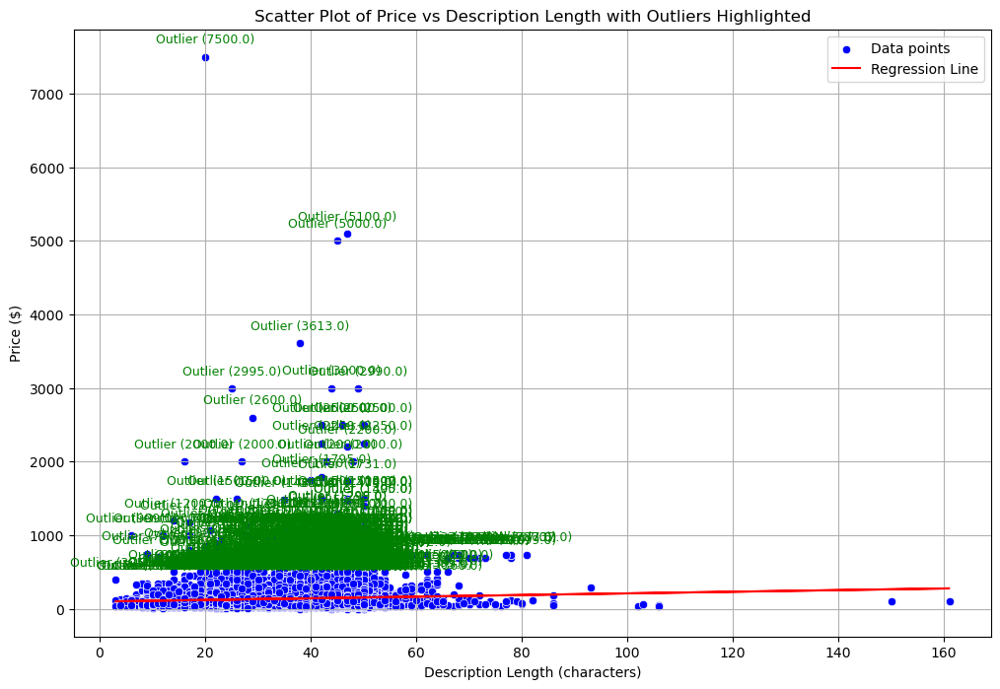

In [68]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.linear_model import LinearRegression

# Load data from uploaded files
file_tsv = 'data/airbnb_last_review.tsv'
file_csv = 'data/airbnb_price.csv'
file_xlsx = 'data/airbnb_room_type.xlsx'

# Read datasets
tsv_data = pd.read_csv(file_tsv, sep='\t')
csv_data = pd.read_csv(file_csv)
xlsx_data = pd.read_excel(file_xlsx)

# Merge datasets on 'listing_id'
merged_data = pd.merge(tsv_data, csv_data, on='listing_id')
merged_data = pd.merge(merged_data, xlsx_data, on='listing_id')

# Clean and process the data
merged_data['price'] = merged_data['price'].str.replace('[^0-9]', '', regex=True).astype(float)
merged_data['description_length'] = merged_data['description'].str.len()
cleaned_data = merged_data.dropna(subset=['price', 'description_length'])

# Identify outliers (prices above 95th percentile)
price_threshold = np.percentile(cleaned_data['price'], 95)
outliers = cleaned_data[cleaned_data['price'] > price_threshold]

# Prepare data for regression
X = cleaned_data['description_length'].values.reshape(-1, 1)
y = cleaned_data['price'].values

# Fit a linear regression model
reg_model = LinearRegression()
reg_model.fit(X, y)
y_pred = reg_model.predict(X)

# Create scatter plot with regression line
plt.figure(figsize=(12, 8))
sns.scatterplot(x='description_length', y='price', data=cleaned_data, label="Data points", color='blue')
plt.plot(cleaned_data['description_length'], y_pred, color='red', label='Regression Line')

# Annotate outliers
ax = plt.gca()
for _, row in outliers.iterrows():
    ax.annotate(f"Outlier ({row['price']})",
                (row['description_length'], row['price']),
                textcoords="offset points",
                xytext=(0, 10),
                ha='center',
                fontsize=9,
                color='green')

# Add labels and legend
plt.title("Scatter Plot of Price vs Description Length with Outliers Highlighted")
plt.xlabel("Description Length (characters)")
plt.ylabel("Price ($)")
plt.legend()
plt.grid()

# Show the plot
plt.show()


### Exploring Unique Seaborn Functions

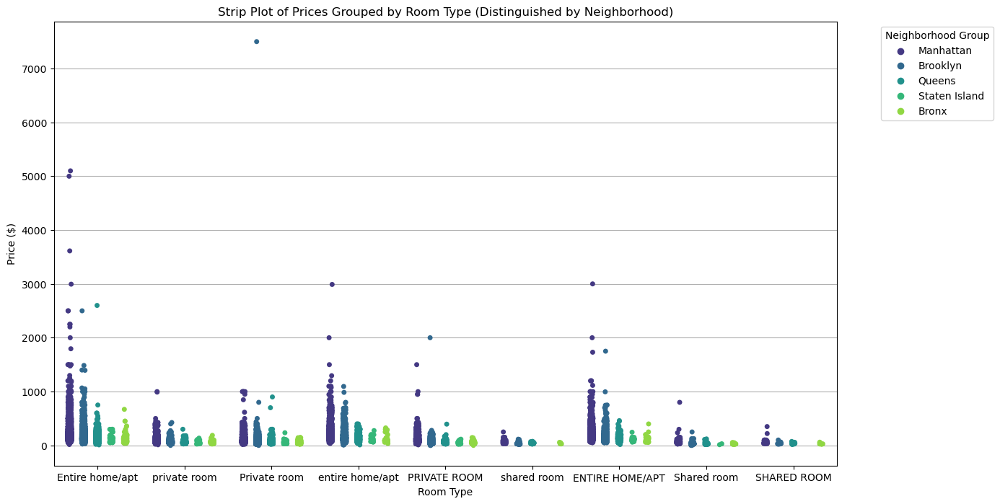

In [73]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import warnings

# Suppress warnings
warnings.filterwarnings("ignore", category=FutureWarning)
# Ensure data is clean and compatible
cleaned_data = cleaned_data.replace([np.inf, -np.inf], np.nan)
cleaned_data = cleaned_data.dropna(subset=['price'])

# Extract main neighborhood group safely
cleaned_data['nbhood_group'] = cleaned_data['nbhood_full'].str.split(',').str[0]

# Create the strip plot
plt.figure(figsize=(14, 8))
sns.stripplot(
    data=cleaned_data,
    x='room_type',
    y='price',
    hue='nbhood_group',
    jitter=True,  # Adds random noise to separate overlapping points
    dodge=True,   # Separates hues within the same room_type
    palette="viridis"
)

# Customize plot
plt.title("Strip Plot of Prices Grouped by Room Type (Distinguished by Neighborhood)")
plt.xlabel("Room Type")
plt.ylabel("Price ($)")
plt.legend(title="Neighborhood Group", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y')

# Show the plot
plt.show()


### Visualization Questions

#### Bar Chart

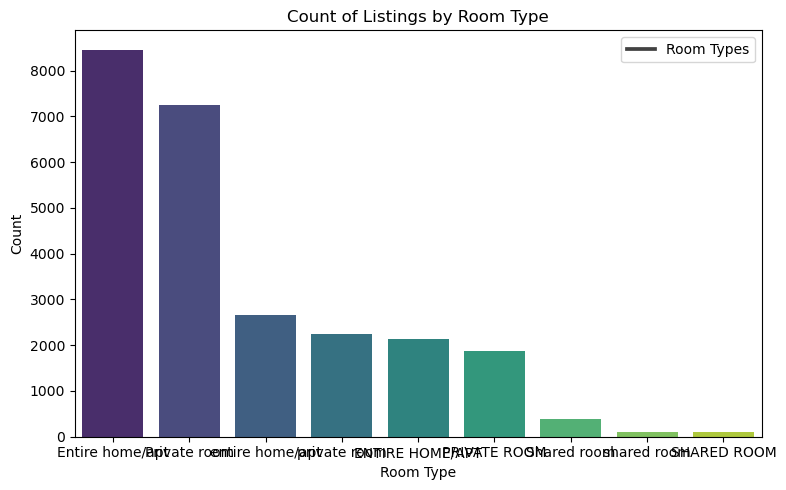

In [78]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# File paths
room_type_path = 'data/airbnb_room_type.xlsx'

# Load room type data
room_type_data = pd.read_excel(room_type_path)

# Plot Bar Chart
plt.figure(figsize=(8, 5))
room_type_counts = room_type_data['room_type'].value_counts()
sns.barplot(x=room_type_counts.index, y=room_type_counts.values, palette='viridis')
plt.title('Count of Listings by Room Type')
plt.xlabel('Room Type')
plt.ylabel('Count')
plt.legend(['Room Types'])

# Adjust layout to avoid label cutoff
plt.tight_layout()

plt.show()


#### Heatmap

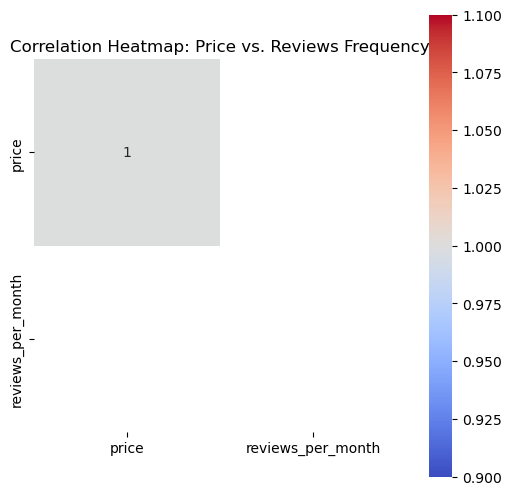

In [79]:
# File paths
price_path = 'data/airbnb_price.csv'
last_review_path = 'data/airbnb_last_review.tsv'

# Load price and last review data
price_data = pd.read_csv(price_path)
last_review_data = pd.read_csv(last_review_path, sep='\t')

# Clean data
price_data['price'] = price_data['price'].str.replace(' dollars', '').astype(float)
merged_data = pd.merge(price_data, last_review_data, on='listing_id', how='left')
merged_data['reviews_per_month'] = merged_data['last_review'].notnull().astype(int)

# Correlation Heatmap
heatmap_data = merged_data[['price', 'reviews_per_month']]
corr_matrix = heatmap_data.corr()
plt.figure(figsize=(6, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', square=True)
plt.title('Correlation Heatmap: Price vs. Reviews Frequency')
plt.show()


#### Pie Chart

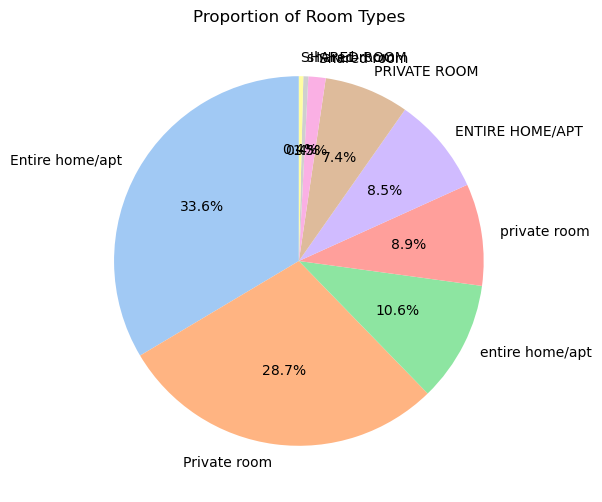

In [83]:
room_type_path = 'data/airbnb_room_type.xlsx'

room_type_data = pd.read_excel(room_type_path)

# Plot Pie Chart
plt.figure(figsize=(6, 6))
room_type_counts = room_type_data['room_type'].value_counts()
room_type_proportions = room_type_counts / room_type_counts.sum()
colors = sns.color_palette('pastel')
plt.pie(room_type_proportions, labels=room_type_proportions.index, colors=colors, autopct='%1.1f%%', startangle=90)
plt.title('Proportion of Room Types')
plt.show()


#### Histogram

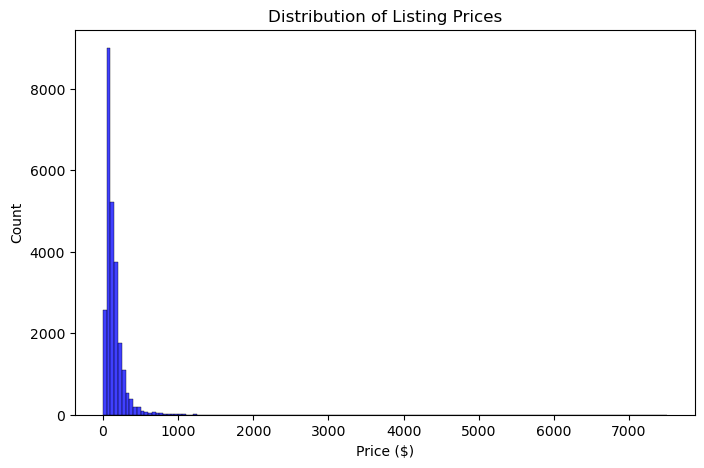

In [82]:
price_path = 'data/airbnb_price.csv'

price_data = pd.read_csv(price_path)
price_data['price'] = price_data['price'].str.replace(' dollars', '').astype(float)

# Plot Histogram
plt.figure(figsize=(8, 5))
sns.histplot(price_data['price'], bins=range(0, int(price_data['price'].max()) + 50, 50), kde=False, color='blue')
plt.title('Distribution of Listing Prices')
plt.xlabel('Price ($)')
plt.ylabel('Count')
plt.show()

#### Violin Plot

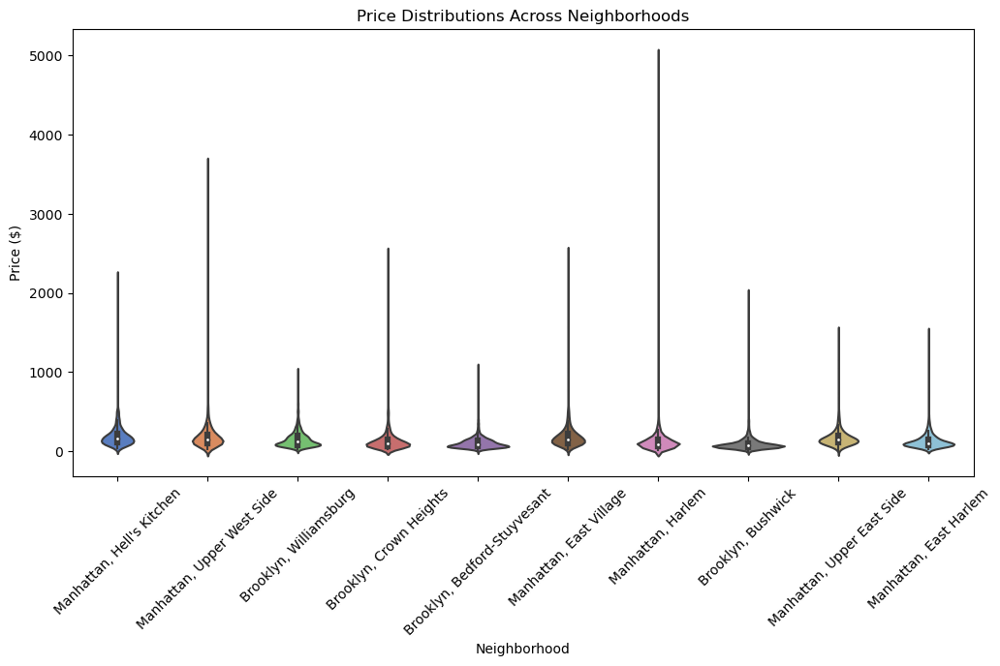

In [84]:
price_path = 'data/airbnb_price.csv'

price_data = pd.read_csv(price_path)
price_data['price'] = price_data['price'].str.replace(' dollars', '').astype(float)

# Plot Violin Plot
plt.figure(figsize=(12, 6))
top_neighborhoods = price_data['nbhood_full'].value_counts().head(10).index  # Top 10 neighborhoods
subset_data = price_data[price_data['nbhood_full'].isin(top_neighborhoods)]
sns.violinplot(x='nbhood_full', y='price', data=subset_data, palette='muted')
plt.title('Price Distributions Across Neighborhoods')
plt.xlabel('Neighborhood')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.show()


# Bonus Questions
### Outlier Detection

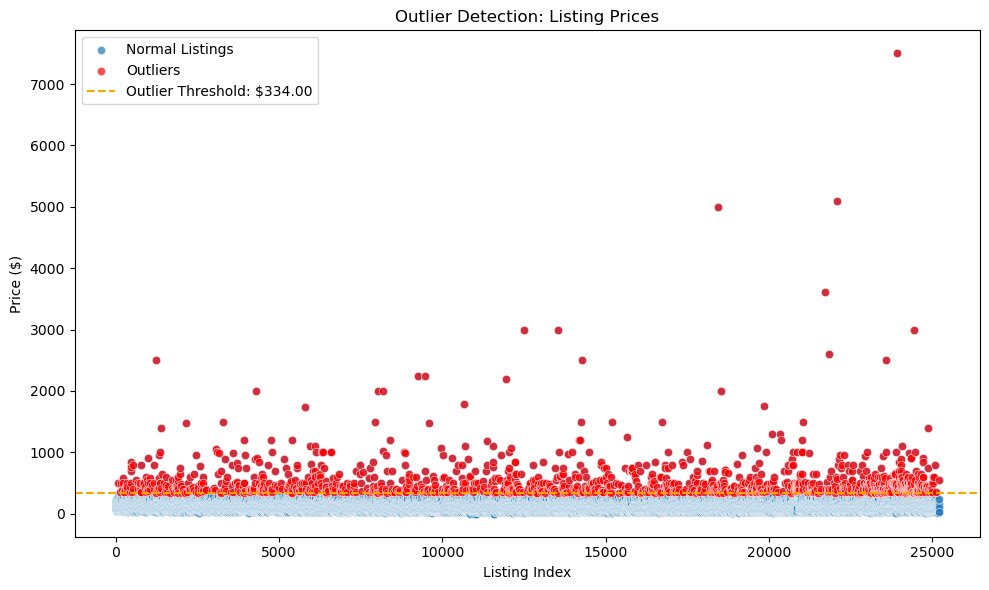

In [86]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# File paths
price_path = 'data/airbnb_price.csv'

# Load price data
price_data = pd.read_csv(price_path)
price_data['price'] = price_data['price'].str.replace(' dollars', '').astype(float)

# Calculate IQR
Q1 = price_data['price'].quantile(0.25)
Q3 = price_data['price'].quantile(0.75)
IQR = Q3 - Q1

# Define outliers
outlier_threshold = Q3 + 1.5 * IQR
outliers = price_data[price_data['price'] > outlier_threshold]

# Scatter plot with outliers highlighted
plt.figure(figsize=(10, 6))
sns.scatterplot(data=price_data, x=price_data.index, y='price', label='Normal Listings', alpha=0.7)
sns.scatterplot(data=outliers, x=outliers.index, y='price', color='red', label='Outliers', alpha=0.7)
plt.axhline(outlier_threshold, color='orange', linestyle='--', label=f'Outlier Threshold: ${outlier_threshold:.2f}')
plt.title('Outlier Detection: Listing Prices')
plt.xlabel('Listing Index')
plt.ylabel('Price ($)')
plt.legend()
plt.tight_layout()
plt.show()


## Interactive Visualization

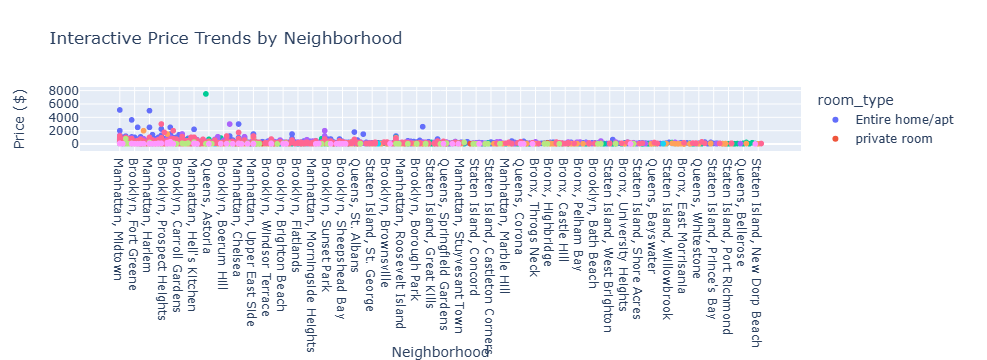

In [87]:
import pandas as pd
import plotly.express as px

price_path = 'data/airbnb_price.csv'
room_type_path = 'data/airbnb_room_type.xlsx'

# Load and merge data
price_data = pd.read_csv(price_path)
price_data['price'] = price_data['price'].str.replace(' dollars', '').astype(float)
room_type_data = pd.read_excel(room_type_path)
merged_data = pd.merge(price_data, room_type_data, on='listing_id')

# Interactive Scatter Plot
fig = px.scatter(
    merged_data,
    x='nbhood_full',  # Neighborhood
    y='price',        # Price
    color='room_type',  # Color by room type
    hover_data=['description', 'room_type', 'price'],  # Tooltips
    title='Interactive Price Trends by Neighborhood'
)

fig.update_layout(
    xaxis_title='Neighborhood',
    yaxis_title='Price ($)',
    showlegend=True
)

fig.show()